### Importation

In [1]:
import numpy as np
import torch 
from framework.SMS import import_dataset_fromSMS
import networkx as nx

distance_mode = "dijkstra" # "linear_interpolation" or "dijkstra"

datasetName = "swiss1"
datasetSuffix = "-500"
datasetPath = "data/SMS/" + datasetName  + datasetSuffix + "/"
datasetSMS = import_dataset_fromSMS(datasetPath)

CORRUPTED_NODES = 70

sim = list(datasetSMS.keys())[0]
mat = datasetSMS[sim]['adjacency_matrix']
num_nodes = mat.shape[0]
p_vectors_array = datasetSMS[sim]['p_array']
dimP = p_vectors_array.shape[1]

torch_points_labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES)


#plot_graph_from_adjacency_matrix(mat, node_color_scalars=np.sum(p_vectors_array, axis=1), cmap='plasma')

def read_matrix_from_csv_loadtxt(filepath, delimiter=','):
  """
  Reads a NumPy matrix from a CSV file using np.loadtxt().

  Args:
    filepath (str): The path to the CSV file.
    delimiter (str): The character separating values in the CSV file (default is comma).

  Returns:
    numpy.ndarray: The matrix read from the CSV file.
  """
  try:
    matrix = np.loadtxt(filepath, delimiter=delimiter)
    print(f"Successfully loaded matrix from {filepath} using np.loadtxt().")
    return matrix
  except FileNotFoundError:
    print(f"Error: The file '{filepath}' was not found.")
    return None
  except Exception as e:
    print(f"An error occurred while loading the file: {e}")
    return None


path = "data/SMS/" + datasetName  + datasetSuffix +"/sim_" + str(sim)+ "/" + datasetName
p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_p_matrix.csv"))
true_p_vectors_array = (read_matrix_from_csv_loadtxt(path + "_true_p_matrix.csv"))
dimP = p_vectors_array.shape[1]
for x in datasetSMS.values():
    x["p_array"]=p_vectors_array


Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_p_matrix.csv using np.loadtxt().
Successfully loaded matrix from data/SMS/swiss1-500/sim_4390/swiss1_true_p_matrix.csv using np.loadtxt().


In [2]:
from framework.trainFct import *
from torch_geometric.data import Data
from framework.visuals import *
from scipy.sparse.csgraph import shortest_path


latent_dim = 2
input_dim = dimP
batch_size = 16

encoder_hidden_dims=[128, 64, 32]
adj_decoder_hidden_dims=[64, 64, 32]
node_decoder_hidden_dims=[64, 64, 32]
gcn_layers=3
fc_layers=2

dataset = []
for x in datasetSMS.values():
    # Create PyG data object
    x["distance_matrix"] = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")
    data = Data(x=torch.tensor(x["p_array"], dtype=torch.float), 
                edge_index=adj_matrix_to_edge_index(x["adjacency_matrix"])[0], 
                edge_labels=adj_matrix_to_edge_index(x["adjacency_matrix"])[1],
                adjacency_matrix=torch.tensor(x["adjacency_matrix"]))
    dataset.append(data)

# Select a single graph to train on
single_graph = dataset[0]

# Wrap in list for compatibility with DataLoader-like expectations
single_graph_list = [single_graph]

adjacency_matrix = x["adjacency_matrix"]
dist_mat = shortest_path(-np.log(np.maximum(x["adjacency_matrix"], 1e-7)), directed=False, unweighted=False, method="D")

G = nx.from_numpy_array(adjacency_matrix)
G.remove_edges_from(nx.selfloop_edges(G)) # Remove self-loops


/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:128: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: dlopen(/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so, 0x0006): Symbol not found: __ZN2at4_ops16div__Tensor_mode4callERNS_6TensorERKS2_NSt3__18optionalINS6_17basic_string_viewIcNS6_11char_traitsIcEEEEEE
  Referenced from: <2BF76774-0954-3F15-B7FE-8A5E5111D7DF> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_scatter/_scatter_cpu.so
  Expected in:     <A51C8C05-245A-3989-8D3C-9A6704422CA5> /Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch/lib/libtorch_cpu.dylib
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/torch_geometric/typing.py:166: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: dlopen(/

### Theoretical manifold

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 2601 grid points...


Grid compute: 100%|██████████| 2601/2601 [00:00<00:00, 2992.23it/s]


Completed. Cached 2601 / 2601 points.


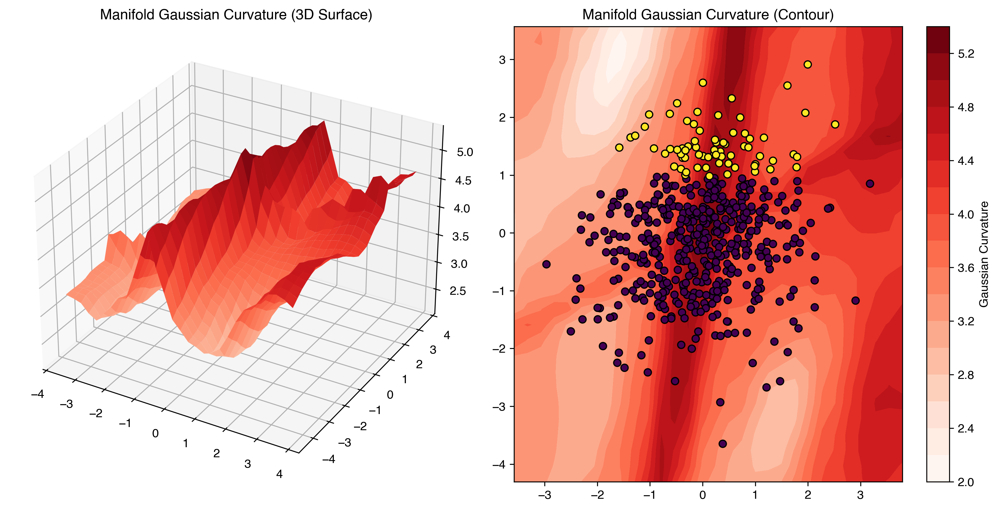

In [3]:
from framework.synthetic_manifold import get_metric
from framework.boundedManifold import BoundedManifold

true_metric = get_metric("soft_swiss", seed=42)

def get_theoretical_metric_tensor(point: torch.tensor):
    return torch.tensor(true_metric(point[0], point[1], dimP))
TheoreticalManifold = BoundedManifold(get_theoretical_metric_tensor, bounds=BoundedManifold.hypercube_bounds(torch.tensor(true_p_vectors_array), margin=0.1, relative=True))
TheoreticalManifold.visualize_manifold_curvature(data_points=torch.tensor(true_p_vectors_array), labels=torch_points_labels)

In [4]:
TheoreticalManifold.exact_geodesic_distance(torch.tensor(true_p_vectors_array[0]), torch.tensor(true_p_vectors_array[10]), num_points=100)

tensor(4.8108)

In [5]:
from framework.torchVersions.distanceApproximations import DistanceApproximations

true_p_vectors_tensor = torch.tensor(true_p_vectors_array)

if distance_mode == "linear_interpolation":
    theoretical_distances = TheoreticalManifold.create_riemannian_distance_matrix(true_p_vectors_tensor,
                                                                            DistanceApproximations.linear_interpolation_distance, 
                                                                            batch_size=8, num_points=20)
elif distance_mode == "dijkstra":
    theoretical_distances = TheoreticalManifold.get_grid_as_graph().compute_shortest_paths(
        true_p_vectors_tensor,
        weight_type="geodesic",  # Uses your metric tensors
        max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
        num_threads=6
    )

Building adjacency (original edges):   0%|          | 0/10100 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/1686 [00:00<?, ?it/s]

Pathfinding (Threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances:   0%|          | 0/125250 [00:00<?, ?it/s]

In [27]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from time import time
import pandas as pd

# Set ICML-style plotting aesthetics
plt.rcParams.update({
    "text.usetex": False,  # Set to True if you have a local LaTeX installation
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "axes.labelsize": 12,
    "font.size": 12,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "figure.figsize": (10, 4),
    "lines.linewidth": 1.5,
    "axes.grid": True,
    "grid.alpha": 0.3
})

def benchmark_geodesic_estimators(manifold, p_vectors, n_pairs=100, seed=42):
    """
    Benchmarks Linear Interpolation and Dijkstra estimators against the 
    Exact Geodesic Ground Truth for a random subset of pairs.
    """
    device = p_vectors.device
    N = p_vectors.shape[0]
    torch.manual_seed(seed)
    
    print(f"--- Starting Benchmark on {n_pairs} random pairs ---")
    # 1. Sample Random Pairs
    # We select indices to avoid self-loops
    idx1 = torch.randint(0, N, (n_pairs,))
    idx2 = torch.randint(0, N, (n_pairs,))
    # Ensure no identical pairs (simple rejection sampling)
    mask = idx1 != idx2
    idx1, idx2 = idx1[mask], idx2[mask]
    n_pairs = len(idx1) # Update actual count
    
    p1_batch = p_vectors[idx1]
    p2_batch = p_vectors[idx2]
    
    # 2. Compute Ground Truth (Exact Geodesic)
    print("1. Computing Ground Truth (Exact L-BFGS)...")
    
    # --- CRITICAL: Freeze the manifold/model parameters ---
    # This prevents 'backward through graph a second time' errors
    # by ensuring we don't try to train the model during path finding.
    # We assume 'manifold' is an nn.Module or holds the model.
    # If manifold is not a Module, freeze 'model_phase1' outside this function instead.
    if isinstance(manifold, torch.nn.Module):
        for param in manifold.parameters():
            param.requires_grad = False
            
    t0 = time()
    gt_dists = []

    for i in tqdm(range(n_pairs)):
        # 1. Detach inputs (Clean start)
        p1 = p1_batch[i].detach()
        p2 = p2_batch[i].detach()
        
        # 2. Enable grad ONLY for the path optimization
        # Since model params are frozen, this won't track model history.
        with torch.enable_grad():
            d = manifold.exact_geodesic_distance(p1, p2, num_points=100)
            
        gt_dists.append(d.item())
            
    gt_dists = np.array(gt_dists)
    time_gt = time() - t0
    print(f"   Done in {time_gt:.2f}s")

    # 3. Compute Linear Interpolation Estimator
    print("2. Computing Linear Interpolation Estimator...")
    t0 = time()
    li_dists = []
    for i in range(n_pairs):
        # Assuming this method exists on your manifold class as per previous context
        # If not, replace with: manifold.linear_interpolation_distance(p1_batch[i], p2_batch[i])
        d = manifold.linear_interpolation_distance(p1_batch[i].detach(), p2_batch[i].detach(), num_points=20)
        li_dists.append(d.item())
    li_dists = np.array(li_dists)
    time_li = time() - t0
    print(f"   Done in {time_li:.2f}s")

    # 4. Compute Dijkstra Estimator
    # Note: To match your snippet, we assume the graph needs a batch of points.
    # We construct a temporary batch of just the test points to avoid computing N*N matrix.
    print("3. Computing Dijkstra Estimator...")
    t0 = time()
    try:
        # Stack pairs into a (2*n_pairs, D) tensor
        # We will compute distances between (0,1), (2,3), etc.
        test_batch = torch.cat([p1_batch.detach(), p2_batch.detach()], dim=0) 
        
        # We use your snippet's logic here
        graph_solver = manifold.get_grid_as_graph()
        
        # We assume compute_shortest_paths returns a distance matrix for the input batch
        # Adjust arguments if your specific implementation differs
        dijk_matrix = graph_solver.compute_shortest_paths(
            test_batch,
            weight_type="geodesic",
            max_grid_neighbors=8
        )
        
        # Extract the specific pair distances from the resulting matrix
        # The distance between p1[i] and p2[i] is at indices [i, n_pairs + i]
        dijk_dists = []
        for i in range(n_pairs):
            d = dijk_matrix[i, n_pairs + i].item()
            dijk_dists.append(d)
        dijk_dists = np.array(dijk_dists)
        
    except Exception as e:
        print(f"   Dijkstra failed: {e}")
        dijk_dists = np.zeros_like(gt_dists) # Fallback for plotting
        
    time_dijk = time() - t0
    print(f"   Done in {time_dijk:.2f}s")

    # 5. Generate ICML Quality Plots
    plot_benchmark_results(gt_dists, li_dists, dijk_dists)

def plot_benchmark_results(gt, li, dijk):
    """
    Generates a 3-panel figure: 
    1. Scatter Plot (GT vs Est)
    2. Residual Distribution
    3. Error stats table
    """
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), constrained_layout=True)
    
    # --- Color Palette ---
    c_li = "#1f77b4"  # ICML blue-ish
    c_dijk = "#ff7f0e" # ICML orange-ish
    
    # --- Panel 1: Correlation Scatter ---
    ax = axes[0]
    # Diagonal reference
    max_val = max(np.max(gt), np.max(li), np.max(dijk)) * 1.05
    ax.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, lw=1, label='Perfect Agreement')
    
    # Scatter points
    ax.scatter(gt, li, alpha=0.6, s=25, c=c_li, label='Linear Interp.', edgecolors='w', linewidth=0.3)
    ax.scatter(gt, dijk, alpha=0.6, s=25, c=c_dijk, label='Dijkstra', marker='^', edgecolors='w', linewidth=0.3)
    
    ax.set_xlabel(r"Ground Truth Distance ($d_{exact}$)")
    ax.set_ylabel(r"Estimated Distance ($\hat{d}$)")
    ax.set_title("Estimator Correlation")
    ax.legend(loc='upper left', frameon=True)
    ax.set_xlim(0, max_val)
    ax.set_ylim(0, max_val)

    # --- Panel 2: Residual Analysis (Bland-Altman style or Relative Error) ---
    ax = axes[1]
    
    # Calculate Relative Error %
    rel_err_li = 100 * (li - gt) / (gt + 1e-6)
    rel_err_dijk = 100 * (dijk - gt) / (gt + 1e-6)
    
    sns.kdeplot(rel_err_li, ax=ax, fill=True, color=c_li, alpha=0.2, linewidth=2, label="Linear Interp.")
    sns.kdeplot(rel_err_dijk, ax=ax, fill=True, color=c_dijk, alpha=0.2, linewidth=2, label="Dijkstra")
    
    ax.axvline(0, color='k', linestyle='--', alpha=0.5)
    ax.set_xlabel("Relative Error (%)")
    ax.set_ylabel("Density")
    ax.set_title("Error Distribution")
    ax.legend()
    
    # Limit x-axis to reasonable range to ignore outliers
    ax.set_xlim(-25, 25) 

    # --- Panel 3: Statistical Summary Table ---
    ax = axes[2]
    ax.axis('off')
    
    # Compute stats
    def get_stats(true, pred):
        r, _ = stats.pearsonr(true, pred)
        rho, _ = stats.spearmanr(true, pred)
        mape = np.mean(np.abs((true - pred) / (true + 1e-6))) * 100
        bias = np.mean(pred - true)
        return f"{r:.3f}", f"{rho:.3f}", f"{mape:.1f}%", f"{bias:.3f}"

    stats_li = get_stats(gt, li)
    stats_dijk = get_stats(gt, dijk)
    
    table_data = [
        ["Metric", "Linear Interp.", "Dijkstra"],
        ["Pearson $r$", stats_li[0], stats_dijk[0]],
        ["Spearman $\\rho$", stats_li[1], stats_dijk[1]],
        ["MAPE", stats_li[2], stats_dijk[2]],
        ["Mean Bias", stats_li[3], stats_dijk[3]],
    ]
    
    # Draw table
    table = ax.table(cellText=table_data, loc='center', cellLoc='center', bbox=[0, 0.2, 1, 0.6])
    table.auto_set_font_size(False)
    table.set_fontsize(11)
    table.scale(1, 1.8)
    
    # Header styling
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight='bold')
            cell.set_facecolor('#f0f0f0')

    plt.suptitle(r"\textbf{Geodesic Estimator Benchmarking}", fontsize=14, y=1.05)
    plt.show()


--- Starting Benchmark on 100 random pairs ---
1. Computing Ground Truth (Exact L-BFGS)...


100%|██████████| 100/100 [21:26<00:00, 12.87s/it]

   Done in 1286.58s
2. Computing Linear Interpolation Estimator...
   Done in 0.02s
3. Computing Dijkstra Estimator...


Building adjacency (original edges):   0%|          | 0/10100 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/200 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/286 [00:00<?, ?it/s]

Pathfinding (Threaded Dijkstra):   0%|          | 0/200 [00:00<?, ?it/s]

Recomputing distances:   0%|          | 0/20100 [00:00<?, ?it/s]

   Done in 1.08s


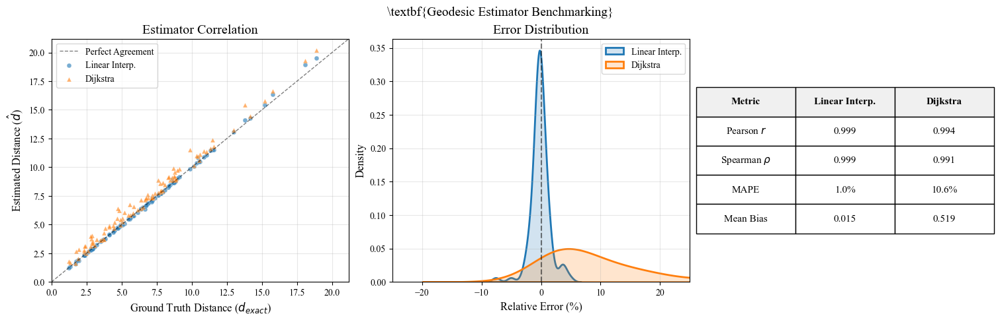

In [ ]:
benchmark_geodesic_estimators(TheoreticalManifold, true_p_vectors_tensor, n_pairs=100)

### Phase 1

#### Training

In [9]:
phase1_epochs = 1500
phase2_epochs = 200
lr_phase1 = 0.005
latent_dim = 2
device = "cuda" if torch.cuda.is_available() else "cpu"

encoder = MLPEncoder(
    input_dim=input_dim,
    hidden_dims=[16, 16],
    latent_dim=latent_dim,
    mlp_layers=2,
    dropout=0.2,
    activation=nn.ELU()
)


node_decoder = NodeAttributeVariationalDecoder(
    latent_dim=latent_dim,
    output_dim=input_dim,
    #hidden_dims=[5000, 128],
    #hidden_dims=[2000, 128],
    hidden_dims=[16],
    dropout=0,
    activation=nn.ELU(),
)

# Create KL annealing scheduler
kl_scheduler = KLAnnealingScheduler(
    anneal_start=0.0,
    #anneal_end=0.001,
    #anneal_end=0.8,
    anneal_end=2,
    anneal_steps=phase1_epochs * len(single_graph_list),
    anneal_type='sigmoid',
)

# Create initial model with only node decoder
model_phase1 = GraphVAE(
    encoder=encoder,
    decoders=[node_decoder],
    kl_scheduler=kl_scheduler,
    compute_latent_manifold=False,
)


In [ ]:
import os

if os.path.exists("models/model_phase1_swissSMS.pth"):
    print("Loading pretrained model")
    model_phase1.load_state_dict(torch.load('models/model_phase1_swissSMS.pth'))
else:
    print("=== Starting Phase 1: Training encoder with node feature reconstruction ===")

    # Phase 1 training
    history_phase1 = train_phase1(
        model=model_phase1,
        data_loader=single_graph_list,
        num_epochs=phase1_epochs,
        lr=lr_phase1,
        weight_decay=1e-5,
        verbose=True,
        device=device,
        loss_coefficient=1
    )

    print("\n=== Phase 1 Complete ===")

    torch.save(model_phase1.state_dict(), 'models/model_phase1_swissSMS.pth')
    print("\n=== Phase 1 Saved ===")

    visualize_training(history_phase1)
    visualize_node_features_reconstruction(model_phase1, single_graph, sample_features=dimP)
    visualize_latent_space(model_phase1, [single_graph])


Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_19784/449094116.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase1.load_state_dict(torch.load('model

In [11]:
import copy

model_phase1 = model_phase1.to('cpu')
model_phase1.encoder.eval()
model_phase2 = copy.deepcopy(model_phase1)

model_phase1.eval()

with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu = model_phase1.encode(x, edge_index=edge_index)

latent_points = latent_mu[0]


Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6675.39it/s]


Completed. Cached 10201 / 10201 points.


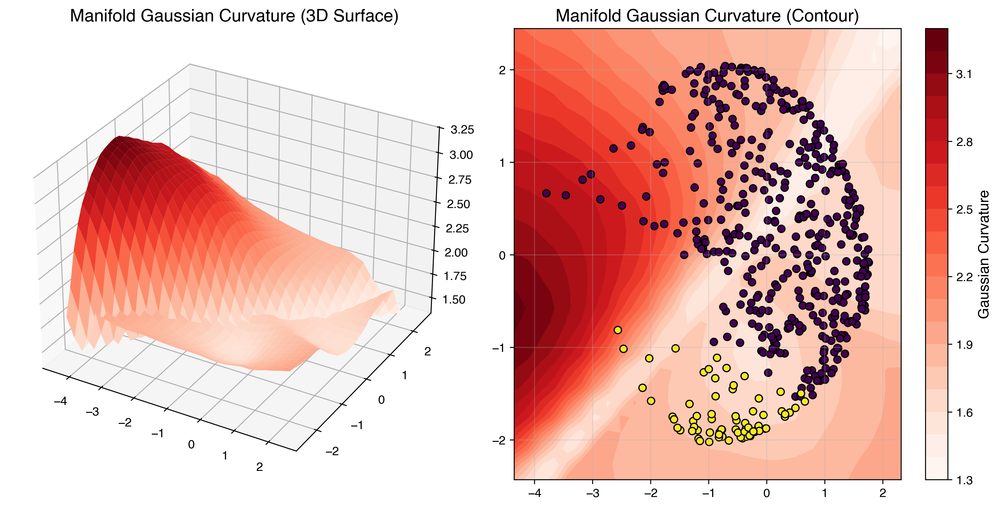

In [12]:

model_phase1.set_compute_latent_manifold(True)
model_phase1.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase1.get_latent_manifold().compute_full_grid_metric_tensor()
model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_points, labels=torch.tensor([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))


In [ ]:

with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase1 = model_phase1.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase1 = model_phase1.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )


Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (Threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances:   0%|          | 0/125250 [00:00<?, ?it/s]

#### Benchmarking

In [ ]:
from framework.synthetic_manifold import ManifoldConfig, generate_manifold_data, approx_jacobian_rank, IMMERSIONS, load_dataset, metric_pullback_alignment_error, geodesic_benchmark

X, Z_true, meta, Z_vae, immersion, true_metric = load_dataset(datasetPath + "soft_swiss")

def VAE_metric_phase1(point : np.ndarray):
    return model_phase1.get_latent_manifold().metric_tensor(torch.tensor(point)).detach().numpy()

summary = metric_pullback_alignment_error(
    seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    D=20,
    k=12,
)

geo = geodesic_benchmark(
    seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    D=20,
    k_graph=12,
    subsample=500,  # speed
)
print("Geodesic distance correlation:", geo["pairwise_corr"])
print("Mean pullback metric rel. error:", summary["mean_rel_error"])
print("Volume element corr (sqrt(det G)):", summary["volume_corr"])


Geodesic distance correlation: 0.40913659209079084
Mean pullback metric rel. error: 0.999999999955244
Volume element corr (sqrt(det G)): 0.2283399948305493


In [ ]:
def tangent_angle_benchmark(
    seeds_uv: np.ndarray,
    codes_z: np.ndarray,
    true_metric_func: Callable[[float,float,int], np.ndarray],
    vae_metric_func: Callable[[np.ndarray], np.ndarray],
    D: int,
    subsample: int | None = 300
) -> dict:
    """
    Compare angles between random tangent vectors at corresponding points.
    Returns correlation of cos(theta) between true and VAE tangent vectors.
    """
    N = seeds_uv.shape[0]
    idx = np.arange(N)
    if subsample is not None and subsample < N:
        rng = np.random.default_rng(0)
        idx = rng.choice(N, size=subsample, replace=False)

    U = seeds_uv[idx]
    Z = codes_z[idx]

    cos_angles_true = []
    cos_angles_vae  = []

    for i in range(len(U)):
        # Random tangent vectors in latent space
        rng = np.random.default_rng(i)
        v1 = rng.normal(size=(2,))
        v2 = rng.normal(size=(2,))
        v1 /= np.linalg.norm(v1)
        v2 /= np.linalg.norm(v2)

        Gtrue = true_metric_func(float(U[i,0]), float(U[i,1]), D)
        Gvae  = vae_metric_func(Z[i])

        # Compute squared lengths & angles via pullback metric
        def cos_angle(v1,v2,G):
            return (v1 @ G @ v2) / (np.sqrt(v1 @ G @ v1) * np.sqrt(v2 @ G @ v2))

        cos_angles_true.append(cos_angle(v1,v2,Gtrue))
        cos_angles_vae.append(cos_angle(v1,v2,Gvae))

    corr = np.corrcoef(cos_angles_true, cos_angles_vae)[0,1]

    return {
        "tangent_angle_corr": float(corr),
        "cos_true": np.array(cos_angles_true),
        "cos_vae": np.array(cos_angles_vae),
        "indices": idx,
    }


def curvature_benchmark(
    seeds_uv: np.ndarray,
    codes_z: np.ndarray,
    true_curvature_func: Callable[[float,float,int], float],
    vae_curvature_func: Callable[[np.ndarray], float],
    subsample: int | None = 300
) -> dict:
    """
    Compare scalar curvatures (Gaussian or Ricci for 2D manifold) at corresponding points.
    Returns correlation of scalar curvature.
    """
    N = seeds_uv.shape[0]
    idx = np.arange(N)
    if subsample is not None and subsample < N:
        rng = np.random.default_rng(0)
        idx = rng.choice(N, size=subsample, replace=False)

    U = seeds_uv[idx]
    Z = codes_z[idx]

    K_true = np.array([true_curvature_func(U[i]) for i in range(len(U))])
    K_vae  = np.array([vae_curvature_func(Z[i]) for i in range(len(Z))])

    corr = np.corrcoef(K_true, K_vae)[0,1]

    return {
        "curvature_corr": float(corr),
        "K_true": K_true,
        "K_vae": K_vae,
        "indices": idx,
    }


def rank_distance_correlation(
    seeds_uv: np.ndarray,
    codes_z: np.ndarray,
    true_metric_func: Callable[[float,float,int], np.ndarray],
    vae_metric_func: Callable[[np.ndarray], np.ndarray],
    D: int,
    subsample: int | None = 300
) -> dict:
    """
    Compute pairwise distance matrices (Euclidean w.r.t. pullback metric) and rank correlation.
    """
    N = seeds_uv.shape[0]
    idx = np.arange(N)
    if subsample is not None and subsample < N:
        rng = np.random.default_rng(0)
        idx = rng.choice(N, size=subsample, replace=False)

    U = seeds_uv[idx]
    Z = codes_z[idx]

    # Compute pairwise distances
    def pairwise_dists(X, metric_func):
        M = len(X)
        Dmat = np.zeros((M,M))
        for i in range(M):
            G_i = metric_func(X[i])
            for j in range(i+1, M):
                diff = X[j] - X[i]
                Dmat[i,j] = Dmat[j,i] = np.sqrt(diff @ G_i @ diff)
        return Dmat

    D_true = pairwise_dists(U, lambda pt: true_metric_func(float(pt[0]), float(pt[1]), D))
    D_vae  = pairwise_dists(Z, vae_metric_func)

    iu, ju = np.triu_indices(D_true.shape[0], k=1)
    ranks_true = np.argsort(np.argsort(D_true[iu,ju]))
    ranks_vae  = np.argsort(np.argsort(D_vae[iu,ju]))
    corr = np.corrcoef(ranks_true, ranks_vae)[0,1]

    return {
        "rank_corr": float(corr),
        "D_true": D_true,
        "D_vae": D_vae,
        "indices": idx,
    }

In [ ]:
angles = tangent_angle_benchmark(seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    subsample=500,  # speed
    D=20,
)

print("Angles between tangent vectors correlation:", angles["tangent_angle_corr"])

ranks = rank_distance_correlation(
    seeds_uv=true_p_vectors_array,
    codes_z=latent_points.detach().numpy(),
    true_metric_func=true_metric,
    vae_metric_func=VAE_metric_phase1,
    subsample=500,  # speed
    D=20,
) 
print("Pairwise distance rank correlation:", ranks["rank_corr"])


Angles between tangent vectors correlation: 0.8329869349924119
Pairwise distance rank correlation: 0.4215094525058656


In [ ]:
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report
x = (theoretical_distances/torch.max(theoretical_distances)).flatten().numpy().reshape(-1, 1)
dists_phase1 = torch.tensor(dists_phase1)
y1 = (dists_phase1/torch.max(dists_phase1)).flatten().numpy()
# 2. Add an intercept column for the statsmodels OLS model
#x = sm.add_constant(x)

# 3. Create and fit the OLS (Ordinary Least Squares) model
model = sm.OLS(x,y1)
results = model.fit()

# 4. Print the R-style summary
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.890
Model:                            OLS   Adj. R-squared (uncentered):              0.890
Method:                 Least Squares   F-statistic:                          2.032e+06
Date:                Mon, 19 Jan 2026   Prob (F-statistic):                        0.00
Time:                        15:34:21   Log-Likelihood:                      3.0463e+05
No. Observations:              250000   AIC:                                 -6.093e+05
Df Residuals:                  249999   BIC:                                 -6.092e+05
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_5360/2775034190.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dists_phase1 = torch.tensor(dists_phase1)


In [ ]:
from scipy.stats import spearmanr

spearman_rho, p_value = spearmanr(x, y1)

print(f"The Spearman correlation coefficient is: {spearman_rho:.4f}")
print(f"The p-value is: {p_value:.4f}")


The Spearman correlation coefficient is: 0.8102
The p-value is: 0.0000


## Phase 2

In [ ]:
from framework.KLAnnealingScheduler import NoKLScheduler

#lr_phase2 = 0.0005
lr_phase2 = 0.008
phase2_epochs = 100
num_heat_times = 15

print("=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===")

model_phase2.set_compute_latent_manifold(True)
model_phase2.construct_latent_manifold(bounds=BoundedManifold.hypercube_bounds(latent_points, margin=0.1, relative=True), force=True)
model_phase2.set_encoder_freeze(True)


distance_decoder = ManifoldHeatKernelDecoder(
    distance_mode=distance_mode,
    latent_dim=latent_dim,
    num_eigenvalues=500,
    num_integration_points=20,
    name="adj_decoder",
    ema_lag_factor=0.005,
    num_heat_time=num_heat_times,
    retain_high_freq_threshold=0.7,
    suppress_low_freq_threshold= 5e-1,
)

# Add to your GraphVAE model
model_phase2.add_decoder(distance_decoder)

# Set reference decoder (the node attribute decoder)
#model_phase2.get_decoder("adj_decoder").giveManifoldInstance(model_phase2.get_latent_manifold())
model_phase2.get_decoder("adj_decoder").giveVAEInstance(model_phase2)

# Reset KL scheduler for phase 2
model_phase2.kl_scheduler = NoKLScheduler()


if os.path.exists("models/model_phase2_swissSMS_"+ distance_mode + ".pth"):
    print("Loading pretrained model")
    model_phase2.load_state_dict(torch.load('model_phase2_swissSMS_'+ distance_mode + '.pth'))
else:
    # Phase 2 training
    history_phase2 = train_phase2(
        model=model_phase2,
        data_loader=single_graph_list,
        latent_points=latent_points,
        num_epochs=phase2_epochs,
        lr=lr_phase2,
        weight_decay=1e-5,
    #    decoder_weights={"adj_decoder": -1, "node_attr_decoder":-1 },
        decoder_weights={"adj_decoder": 1, "node_attr_decoder":0 },
        verbose=True,
        device=device
    )

    print("\n=== Phase 2 Complete ===")


=== Starting Phase 2: Freezing encoder and adding adjacency decoder ===
Loading pretrained model


/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_5360/3674410192.py:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_phase2.load_state_dict(torch.load('mode

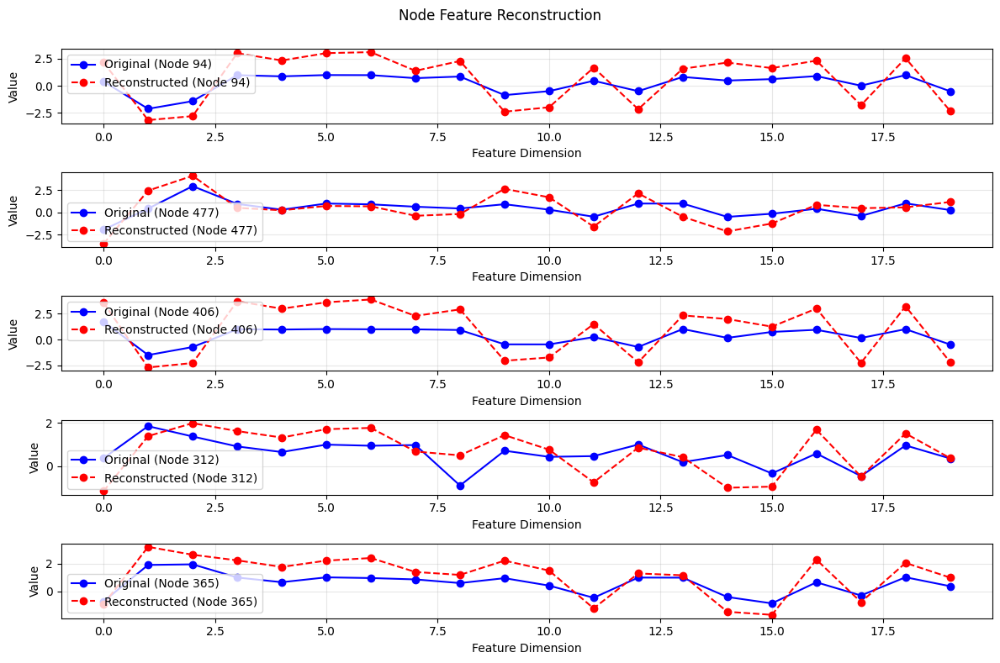

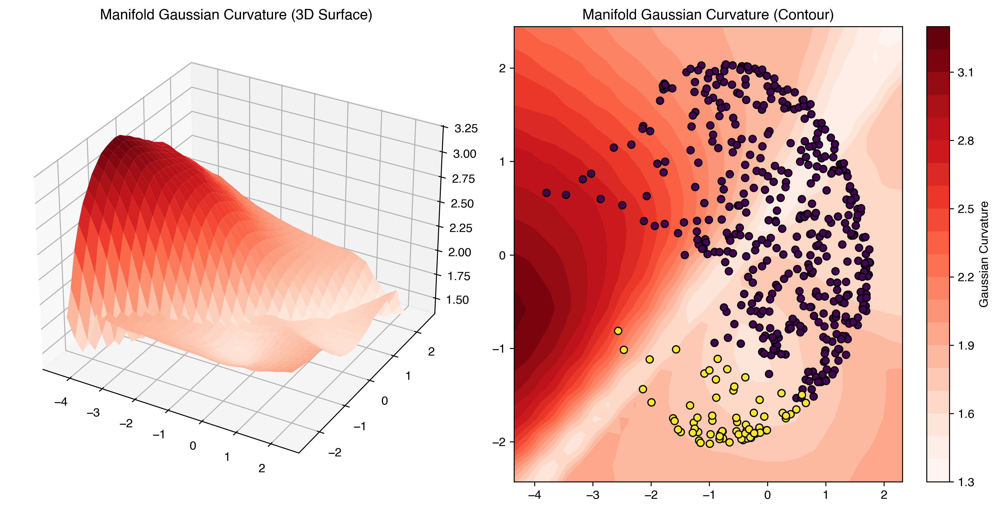

Full grid is not computed, we trigger compute_full_grid_metric_tensor...
Computing metric tensors for 10201 grid points...


Grid compute: 100%|██████████| 10201/10201 [00:01<00:00, 6094.52it/s]


Completed. Cached 10201 / 10201 points.


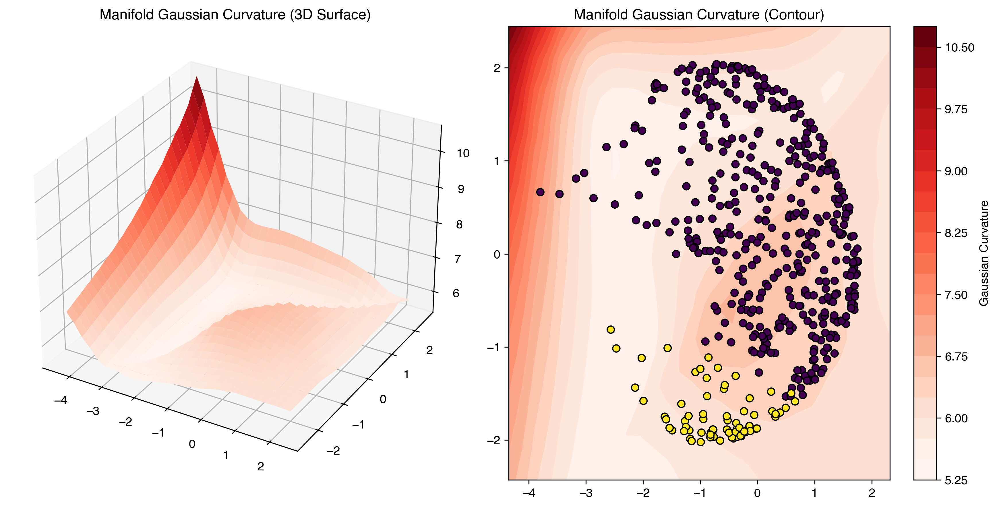

In [ ]:
visualize_node_features_reconstruction(model_phase2, single_graph, sample_features=dimP)
with torch.no_grad():
    x = single_graph.x.to(device)
    edge_index = single_graph.edge_index.to(device)
    latent_mu2 = model_phase2.encode(x, edge_index=edge_index)

model_phase1.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)
model_phase2.get_latent_manifold().visualize_manifold_curvature(data_points=latent_mu2[0], labels=torch_points_labels)

Full grid already computed for current epoch.
Full grid already computed for current epoch.


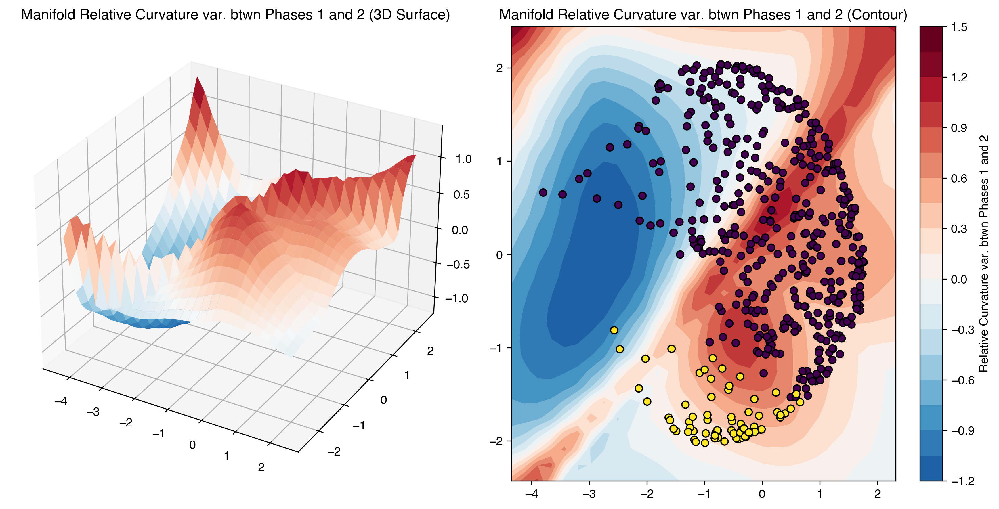

In [ ]:
from framework.utils import compute_curvature_change
curvature_diff, Z1_np, Z2_np = compute_curvature_change(model_phase1, model_phase2)
model_phase2.get_latent_manifold()._plot_manifold_grid(curvature_diff, Z1_np, Z2_np, latent_points=latent_points, labels=torch_points_labels, name="Relative Curvature var. btwn Phases 1 and 2")

In [ ]:
from framework.torchVersions.distanceApproximations import DistanceApproximations

with torch.no_grad():
    if distance_mode == "linear_interpolation":
        dists_phase2 = model_phase2.get_latent_manifold().create_riemannian_distance_matrix(latent_points, 
                                                                                            DistanceApproximations.linear_interpolation_distance, num_points=20)
    elif distance_mode == "dijkstra":
        dists_phase2 = model_phase2.get_latent_manifold().get_grid_as_graph().compute_shortest_paths(
                            latent_points,
                            weight_type="geodesic",  # Uses your metric tensors
                            max_grid_neighbors=8,     # Connect to up to 8 nearest grid nodes
                            num_threads=6
                        )

Building adjacency (original edges):   0%|          | 0/40200 [00:00<?, ?it/s]

Query->Grid connections:   0%|          | 0/500 [00:00<?, ?it/s]

Query->Query connections:   0%|          | 0/340 [00:00<?, ?it/s]

Pathfinding (Threaded Dijkstra):   0%|          | 0/500 [00:00<?, ?it/s]

Recomputing distances:   0%|          | 0/125250 [00:00<?, ?it/s]

## Clustering

#### Baseline

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as scipy
from scipy.linalg import eigh
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score,
    confusion_matrix,
    f1_score,
    roc_auc_score,          # Added
    average_precision_score, # Added (PR-AUC)
    precision_score,        # Added
    recall_score,           # Added
    matthews_corrcoef       # Added
)
import networkx as nx
import community as community_louvain 

def evaluate_clustering(pred_labels, true_labels):
    """
    Evaluate clustering predictions with a comprehensive suite of metrics
    suitable for academic publication (e.g., ICML/NeurIPS).
    
    Assumes binary classification/clustering.
    """

    # Ensure binary and integers
    pred_labels = np.asarray(pred_labels).astype(int)
    true_labels = np.asarray(true_labels).astype(int)

    # --- 1. Label Alignment (Crucial for Clustering) ---
    # Since clustering has no knowledge of true class labels (0 vs 1),
    # we check if flipping the predictions improves accuracy.
    acc_original = np.mean(pred_labels == true_labels)
    acc_flipped = np.mean(1 - pred_labels == true_labels)
    
    if acc_flipped > acc_original:
        pred_labels = 1 - pred_labels
        best_acc = acc_flipped
    else:
        best_acc = acc_original

    # --- 2. Calculate Metrics on Aligned Labels ---
    
    # Confusion matrix
    cm = confusion_matrix(true_labels, pred_labels)
    
    # Standard Clustering Metrics
    ari = adjusted_rand_score(true_labels, pred_labels)
    nmi = normalized_mutual_info_score(true_labels, pred_labels)
    
    # Classification Metrics
    f1 = f1_score(true_labels, pred_labels)
    precision = precision_score(true_labels, pred_labels, zero_division=0)
    recall = recall_score(true_labels, pred_labels, zero_division=0)
    
    # Robustness Metrics (ICML Standards)
    mcc = matthews_corrcoef(true_labels, pred_labels)
    
    # AUC Metrics
    # Note: Using hard labels (0/1) for AUC gives a single point on the curve.
    # For a smoother AUC, you would need the distance to the kmeans centroids.
    roc_auc = roc_auc_score(true_labels, pred_labels)
    pr_auc = average_precision_score(true_labels, pred_labels)

    # --- 3. Report Results ---
    print("Evaluation of Spectral Clustering (ICML Metrics)")
    print("------------------------------------------------")
    print(f"Accuracy               : {best_acc:.4f}")
    print(f"ROC AUC                : {roc_auc:.4f}")
    print(f"PR AUC (Avg Precision) : {pr_auc:.4f}")
    print(f"Matthews Corr. Coeff.  : {mcc:.4f}")
    print(f"F1 Score               : {f1:.4f}")
    print(f"Precision              : {precision:.4f}")
    print(f"Recall                 : {recall:.4f}")
    print(f"Adjusted Rand Index    : {ari:.4f}")
    print(f"Normalized Mutual Info : {nmi:.4f}")
    print("\nConfusion Matrix:")
    print(cm)
    
    return {
        "accuracy": best_acc,
        "roc_auc": roc_auc,
        "pr_auc": pr_auc,
        "mcc": mcc,
        "f1": f1,
        "precision": precision,
        "recall": recall,
        "ari": ari,
        "nmi": nmi,
        "confusion_matrix": cm
    }

def analyze_laplacian(adj_matrix, true_labels, plot_fiedler=True):
    """
    Performs eigenvalue analysis of the Laplacian matrix of a graph.

    Parameters:
    - adj_matrix: np.ndarray, symmetric adjacency matrix
    - plot_fiedler: bool, whether to plot the Fiedler vector (2nd smallest eigenvector)
    """

    # Ensure the matrix is symmetric
    if not np.allclose(adj_matrix, adj_matrix.T):
        raise ValueError("Adjacency matrix must be symmetric")

    # Compute unnormalized Laplacian
    L = scipy.sparse.csgraph.laplacian(adj_matrix, normed=False)

    # Compute eigenvalues and eigenvectors
    eigenvals, eigenvecs = eigh(L)

    # Plot eigenvalue spectrum
    plt.figure(figsize=(10, 4))
    plt.plot(np.sort(eigenvals), marker='o')
    plt.title("Eigenvalue Spectrum of Laplacian")
    plt.xlabel("Index")
    plt.ylabel("Eigenvalue")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Fiedler vector (2nd smallest eigenvector)
    if plot_fiedler and len(eigenvals) >= 2:
        fiedler_vec = eigenvecs[:, 1]
        plt.figure(figsize=(10, 4))
        plt.plot(fiedler_vec, marker='.')
        plt.title("Fiedler Vector (2nd Smallest Eigenvector)")
        plt.xlabel("Node Index")
        plt.ylabel("Value")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        pred_labels = (fiedler_vec > 0).astype(int)
        print(f"Clustering accuracy (Fiedler): ")
        evaluate_clustering(pred_labels, true_labels)

        sc = SpectralClustering(n_clusters=2, affinity='precomputed', assign_labels='kmeans', random_state=0)
        pred_labels = sc.fit_predict(adj_matrix)
        print(f"Clustering accuracy (SpectralClustering): ")
        evaluate_clustering(pred_labels, true_labels)

        print(f"Clustering accuracy (Louvain): ")
        G = nx.from_numpy_array(adj_matrix)  # Use thresholded graph here!
        partition = community_louvain.best_partition(G)
        pred_labels = np.array([partition[i] for i in range(len(adj_matrix))])
        # Cluster Louvain labels into 2 meta-classes
        kmeans = KMeans(n_clusters=2, n_init=10)
        meta_labels = kmeans.fit_predict(pred_labels.reshape(-1, 1))

        evaluate_clustering(meta_labels, true_labels)

    # Useful output
    num_components = np.sum(np.isclose(eigenvals, 0))
    print(f"Number of connected components (zero eigenvalues): {num_components}")
    print(f"Smallest eigenvalues: {eigenvals[:5]}")
    return eigenvals, eigenvecs


In [ ]:
adjacency_matrix = adjacency_matrix.numpy() if isinstance(adjacency_matrix, torch.Tensor) else adjacency_matrix

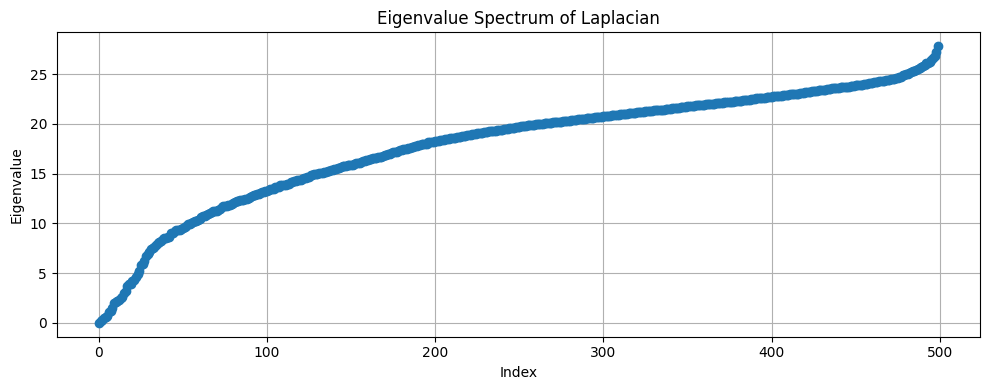

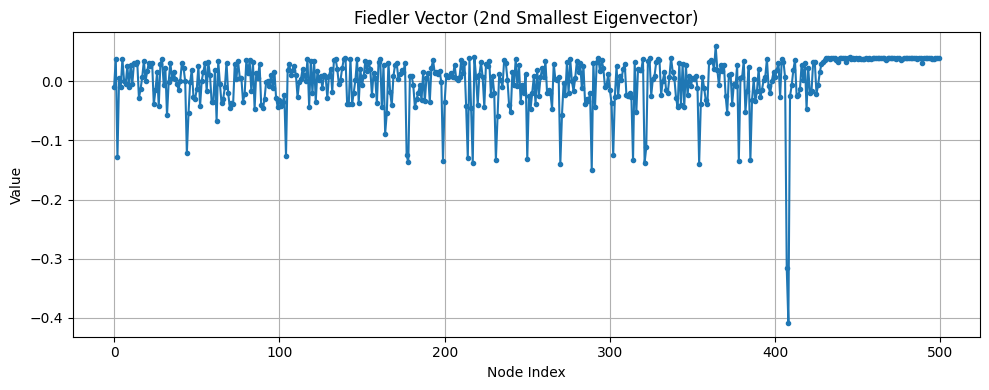

Clustering accuracy (Fiedler): 
Evaluation of Spectral Clustering (ICML Metrics)
------------------------------------------------
Accuracy               : 0.5180
ROC AUC                : 0.7198
PR AUC (Avg Precision) : 0.2251
Matthews Corr. Coeff.  : 0.3145
F1 Score               : 0.3675
Precision              : 0.2251
Recall                 : 1.0000
Adjusted Rand Index    : -0.0315
Normalized Mutual Info : 0.1372

Confusion Matrix:
[[189 241]
 [  0  70]]
Clustering accuracy (SpectralClustering): 
Evaluation of Spectral Clustering (ICML Metrics)
------------------------------------------------
Accuracy               : 0.5160
ROC AUC                : 0.7186
PR AUC (Avg Precision) : 0.2244
Matthews Corr. Coeff.  : 0.3132
F1 Score               : 0.3665
Precision              : 0.2244
Recall                 : 1.0000
Adjusted Rand Index    : -0.0328
Normalized Mutual Info : 0.1364

Confusion Matrix:
[[188 242]
 [  0  70]]
Clustering accuracy (Louvain): 
Evaluation of Spectral Clustering (

In [ ]:
eigenvals, eigenvecs = analyze_laplacian(adjacency_matrix, np.array([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

#### Loss based approach

In [ ]:
def get_spectral_heat_times(eigenvalues, num_times=5):
    # Filter out the zero eigenvalue (connected component)
    valid_eigs = eigenvalues[eigenvalues > 1e-5]

    lambda_max = valid_eigs.max()
    lambda_min = valid_eigs.min() # This is roughly lambda_2

    # Invert to get time scales
    t_min = 1.0 / lambda_max
    t_max = 1.0 / lambda_min

    # Create log-spaced times
    # We often multiply t_max by a factor (e.g., 2 or 4) to ensure full global coverage
    return torch.logspace(torch.log10(t_min), torch.log10(t_max * 4), num_times)

def compute_heat_kernel_divergence(adj: torch.Tensor, distances: torch.Tensor, heat_times: torch.Tensor, latent_dim: int) -> torch.Tensor:
    dist_sq = distances.pow(2).unsqueeze(-1)
    coeffs = (4 * torch.pi * heat_times).pow(-latent_dim / 2)
    exp_term = torch.exp(-dist_sq / (4 * heat_times))
    kernel_stack = coeffs * exp_term
    divergence = (adj-kernel_stack.sum(dim=-1)).pow(2)
    return divergence
        

from framework.geometry import compute_graph_laplacian
laplacian = compute_graph_laplacian(adjacency_matrix=torch.tensor(adjacency_matrix))
heat_times = get_spectral_heat_times(eigenvalues=torch.clamp(laplacian,min=0.0), num_times=num_heat_times)

div_phase1 = compute_heat_kernel_divergence(torch.tensor(adjacency_matrix), torch.tensor(dists_phase1), heat_times, 2)
div_phase2 = compute_heat_kernel_divergence(torch.tensor(adjacency_matrix), torch.tensor(dists_phase2), heat_times, 2)

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_5360/533120638.py:29: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  div_phase1 = compute_heat_kernel_divergence(torch.tensor(adjacency_matrix), torch.tensor(dists_phase1), heat_times, 2)
/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_5360/533120638.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  div_phase2 = compute_heat_kernel_divergence(torch.tensor(adjacency_matrix), torch.tensor(dists_phase2), heat_times, 2)


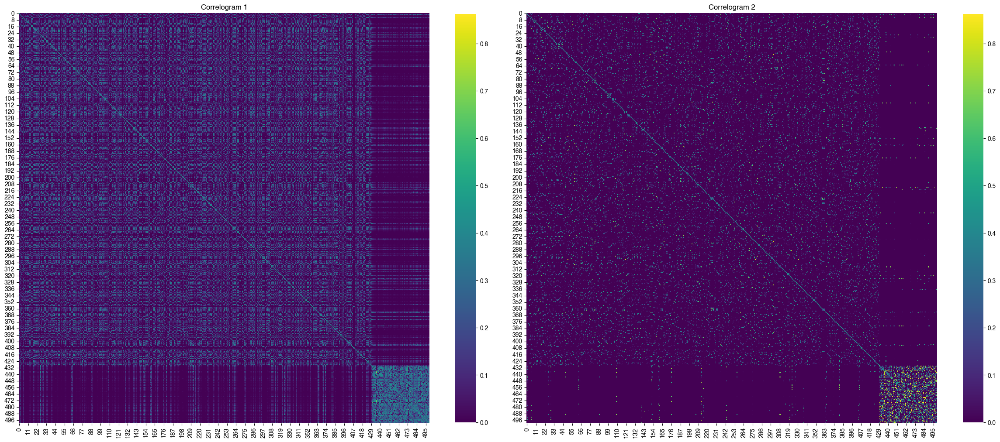

<module 'matplotlib.pyplot' from '/Users/aldric-l/Library/Python/3.11/lib/python/site-packages/matplotlib/pyplot.py'>

In [ ]:
plot_correlogram(div_phase1, div_phase2)

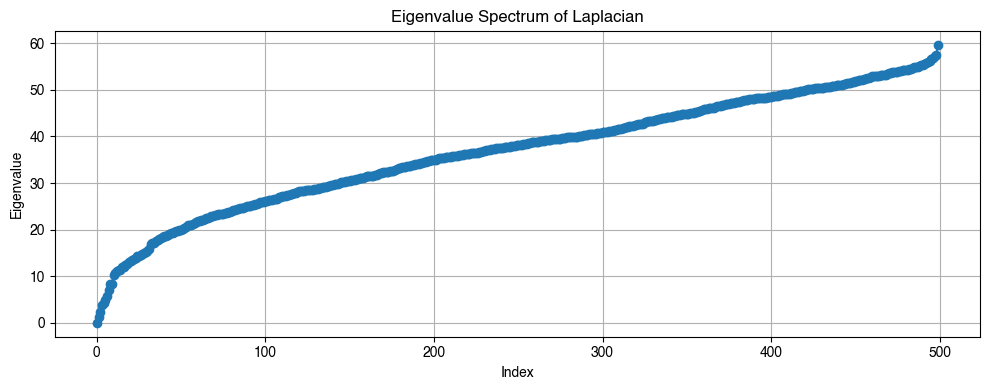

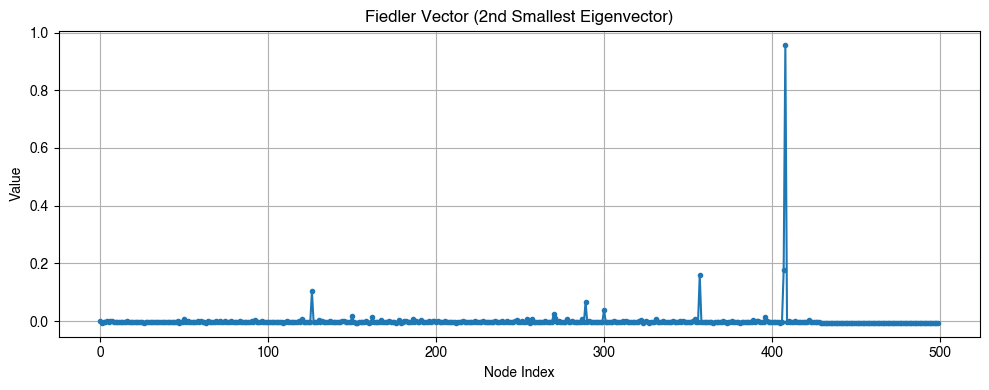

Clustering accuracy (Fiedler): 
Evaluation of Spectral Clustering (ICML Metrics)
------------------------------------------------
Accuracy               : 0.7480
ROC AUC                : 0.4349
PR AUC (Avg Precision) : 0.1400
Matthews Corr. Coeff.  : -0.1433
F1 Score               : 0.0000
Precision              : 0.0000
Recall                 : 0.0000
Adjusted Rand Index    : -0.0968
Normalized Mutual Info : 0.0477

Confusion Matrix:
[[374  56]
 [ 70   0]]
Clustering accuracy (SpectralClustering): 
Evaluation of Spectral Clustering (ICML Metrics)
------------------------------------------------
Accuracy               : 0.5760
ROC AUC                : 0.7535
PR AUC (Avg Precision) : 0.2482
Matthews Corr. Coeff.  : 0.3547
F1 Score               : 0.3977
Precision              : 0.2482
Recall                 : 1.0000
Adjusted Rand Index    : 0.0138
Normalized Mutual Info : 0.1632

Confusion Matrix:
[[218 212]
 [  0  70]]
Clustering accuracy (Louvain): 
Evaluation of Spectral Clustering (

In [ ]:
eigenvals, eigenvecs = analyze_laplacian(div_phase1.numpy(), np.array([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

#### Residuals based approach

/var/folders/qc/fbm2wz190nqd87d2mq7l90_80000gn/T/ipykernel_5360/4130616402.py:8: RuntimeWarning: invalid value encountered in divide
  res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)


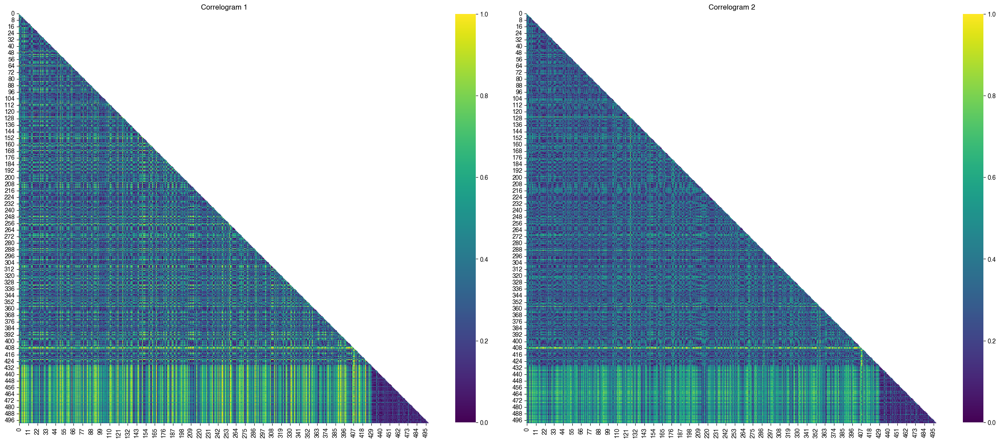

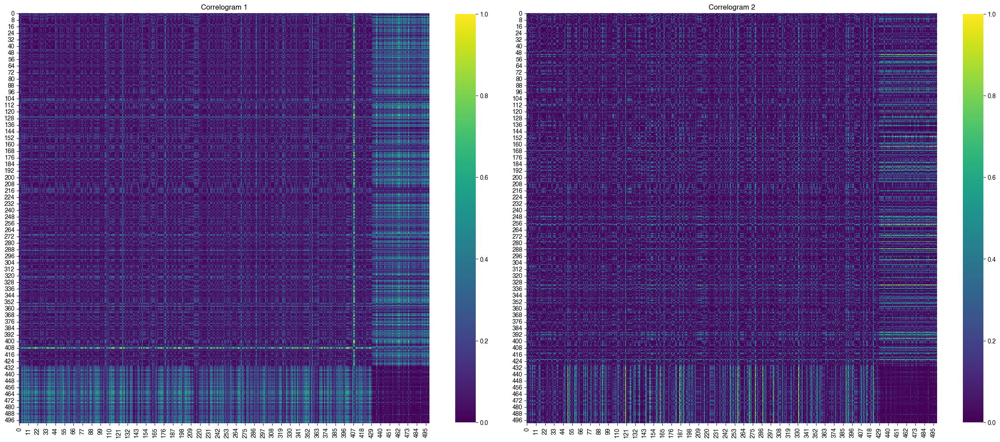

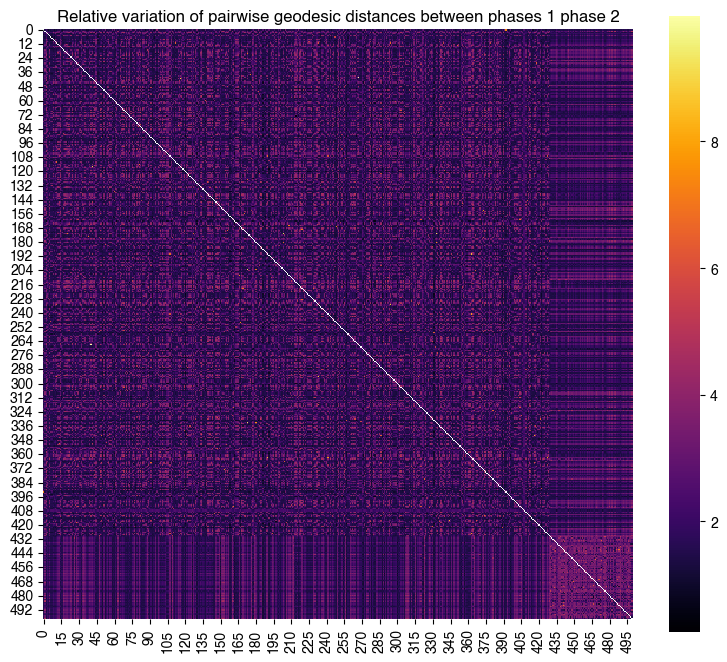

In [ ]:
if isinstance(dists_phase1, torch.Tensor):
    dists_phase1 = dists_phase1.detach().numpy()
if isinstance(dists_phase2, torch.Tensor):
    dists_phase2 = dists_phase2.detach().numpy()

local_dists_phase1 = dists_phase1
res = np.abs((dists_phase2 - local_dists_phase1))
res3 = np.abs((local_dists_phase1 - dists_phase2)/local_dists_phase1)

res2 = np.abs((local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)) - dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0))))

_ = plot_correlogram(local_dists_phase1/np.max(np.where(local_dists_phase1 > 0, local_dists_phase1, 0)), dists_phase2/np.max(np.where(dists_phase2 > 0, dists_phase2, 0)), remove_diagonal=True, triangular=True)

_ = plot_correlogram((res/np.max(res))**2, (res2/np.max(res2))**2)
_ = plot_correlogram(res3, cmap="inferno", titles=["Relative variation of pairwise geodesic distances between phases 1 phase 2"] )

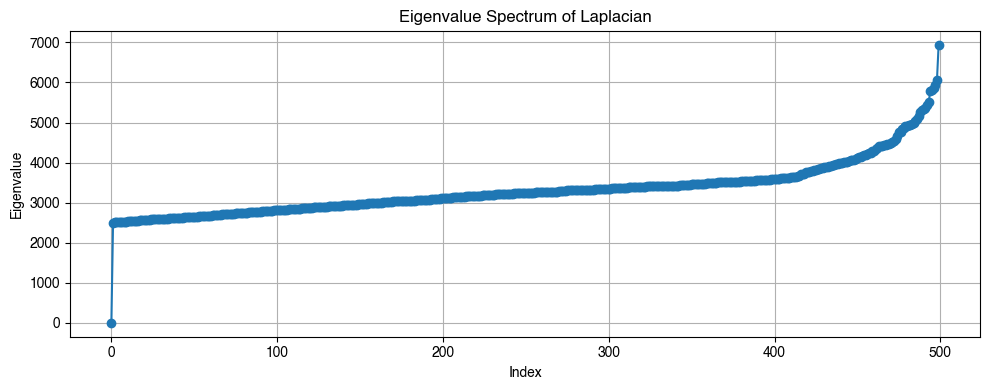

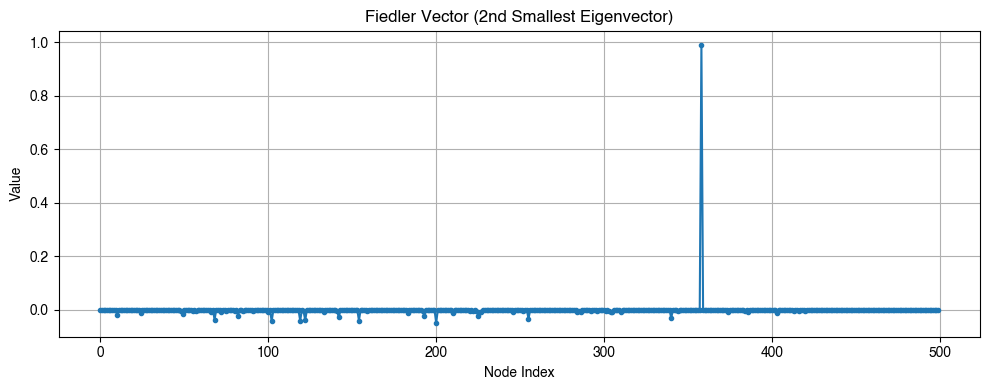

Clustering accuracy (Fiedler): 
Evaluation of Spectral Clustering (ICML Metrics)
------------------------------------------------
Accuracy               : 0.8640
ROC AUC                : 0.5322
PR AUC (Avg Precision) : 0.1746
Matthews Corr. Coeff.  : 0.1782
F1 Score               : 0.1282
Precision              : 0.6250
Recall                 : 0.0714
Adjusted Rand Index    : 0.0859
Normalized Mutual Info : 0.0421

Confusion Matrix:
[[427   3]
 [ 65   5]]
Clustering accuracy (SpectralClustering): 
Evaluation of Spectral Clustering (ICML Metrics)
------------------------------------------------
Accuracy               : 0.5700
ROC AUC                : 0.3733
PR AUC (Avg Precision) : 0.1304
Matthews Corr. Coeff.  : -0.1889
F1 Score               : 0.0611
Precision              : 0.0440
Recall                 : 0.1000
Adjusted Rand Index    : -0.0537
Normalized Mutual Info : 0.0412

Confusion Matrix:
[[278 152]
 [ 63   7]]
Clustering accuracy (Louvain): 
Evaluation of Spectral Clustering (

In [ ]:
eigenvals, eigenvecs = analyze_laplacian(res, np.array([0]*(num_nodes-CORRUPTED_NODES) + [1]*CORRUPTED_NODES))

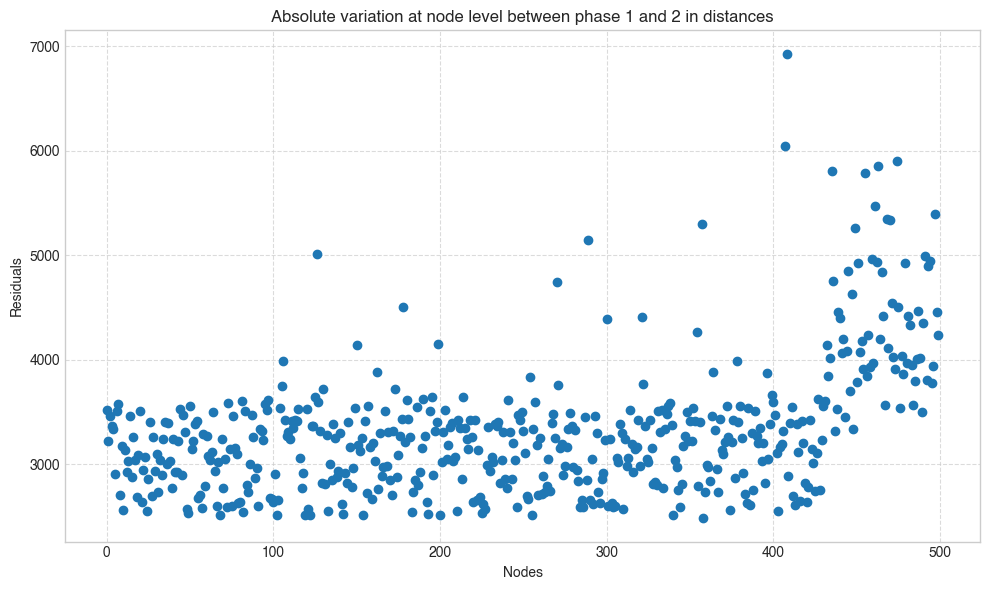

In [ ]:
plt.figure(figsize=(10, 6)) # Set the size of the plot for better readability

plt.rcParams['font.family'] = 'sans-serif'
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']
#plt.plot(np.sum(res, axis=0)/np.max(np.sum(res, axis=0), axis=0), marker='o', linestyle='')
#plt.plot(np.sum(res2, axis=0)/np.max(np.sum(res2, axis=0), axis=0), marker='o', linestyle='')
plt.plot(np.sum(np.nan_to_num(res, 0.0), axis=0), marker='o', linestyle='')
# Add a horizontal line at y=0

# --- Customize the Plot ---
#plt.savefig("dists_total_var_phase1_2.png", dpi=500, bbox_inches='tight')

plt.xlabel('Nodes') # Label for the x-axis
plt.ylabel('Residuals') # Label for the y-axis, updated to reflect the ratio
plt.title('Absolute variation at node level between phase 1 and 2 in distances') # Title of the plot, updated
plt.grid(True, linestyle='--', alpha=0.7) # Add a grid for easier reading
plt.tight_layout() # Adjust plot to ensure everything fits without overlapping
plt.show()

In [ ]:
from scipy import stats

sums = np.sum(np.nan_to_num(res, 0.0), axis=0)
group_clean, group_corrupted = sums[:-CORRUPTED_NODES], sums[-CORRUPTED_NODES:]
# 3. Perform the t-test
# We use equal_var=False to perform Welch's t-test, which does not assume 
# equal population variance (often safer when comparing normal vs corrupted data).
t_stat, p_val = stats.ttest_ind(group_clean, group_corrupted, equal_var=False)

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_val}")

def cohens_d(group1, group2):
    # Calculate the size of samples
    n1, n2 = len(group1), len(group2)
    
    # Calculate the variance of the samples
    var1, var2 = np.var(group1, ddof=1), np.var(group2, ddof=1)
    
    # Calculate the pooled standard deviation
    # (n1-1)*var1 + (n2-1)*var2  /  (n1+n2-2)
    pooled_se = np.sqrt(((n1 - 1) * var1 + (n2 - 1) * var2) / (n1 + n2 - 2))
    
    # Calculate means
    mu1, mu2 = np.mean(group1), np.mean(group2)
    
    # Calculate Cohen's d
    return (mu1 - mu2) / pooled_se

# Calculate and print
d = cohens_d(group_clean, group_corrupted)
print(f"Cohen's d: {d}")

T-statistic: -14.447474375103923
P-value: 3.884007670263606e-24
Cohen's d: -2.348771820079751



=== ICML Standard Metrics Report ===
Selected Threshold     : 3774.3792 (Maximizes F1)
------------------------------------
ROC AUC                : 0.9588
PR AUC (Avg Precision) : 0.7151
Matthews Corr. Coeff.  : 0.7700
Accuracy               : 0.9420
F1 Score               : 0.8027
Precision              : 0.7662
Recall                 : 0.8429
Adjusted Rand Index    : 0.7091
Normalized Mutual Info : 0.5254

Confusion Matrix:
[[412  18]
 [ 11  59]]



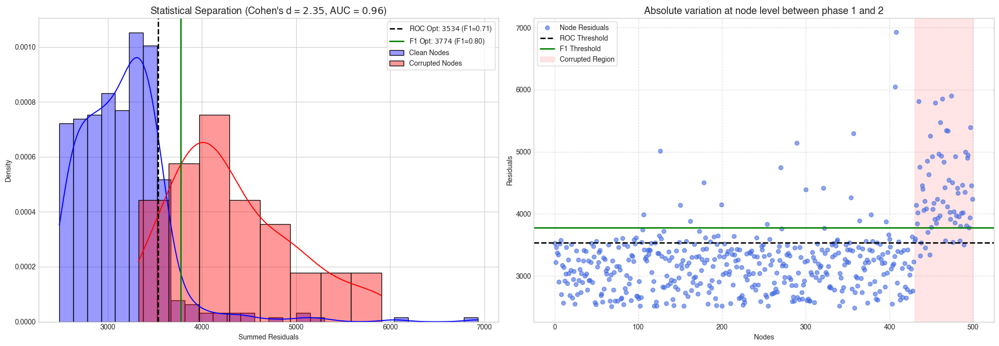

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    roc_curve, 
    auc, 
    precision_recall_curve, 
    f1_score,
    accuracy_score,
    matthews_corrcoef,
    average_precision_score, # This is PR-AUC
    precision_score,
    recall_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    confusion_matrix
)

# --- 1. Data Prep (Assumes group_clean and group_corrupted exist) ---
# Reconstruct the full array for the scatter plot
all_scores_ordered = np.concatenate([group_clean, group_corrupted])
true_labels = np.concatenate([np.zeros(len(group_clean)), np.ones(len(group_corrupted))])

# --- 2. Calculate Thresholds & Metrics ---

# ROC Curve & AUC
fpr, tpr, roc_thresholds = roc_curve(true_labels, all_scores_ordered)
ix_roc = np.argmax(tpr - fpr)
best_thresh_roc = roc_thresholds[ix_roc]
roc_auc = auc(fpr, tpr)
f1_at_roc = f1_score(true_labels, (all_scores_ordered >= best_thresh_roc).astype(int))

# Precision-Recall Curve & F1 Optimal Threshold
precisions, recalls, pr_thresholds = precision_recall_curve(true_labels, all_scores_ordered)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-10)
ix_f1 = np.argmax(f1_scores)
best_thresh_f1 = pr_thresholds[ix_f1]
best_f1_val = f1_scores[ix_f1]

# --- NEW: Calculate Full ICML Metrics Suite ---
# We use the "F1 Optimal Threshold" to generate the binary predictions 
# for the hard metrics (MCC, Acc, etc.) as this is the standard 'tuned' classifier.

pred_labels_optimal = (all_scores_ordered >= best_thresh_f1).astype(int)

# Continuous Metrics (do not depend on threshold)
pr_auc = average_precision_score(true_labels, all_scores_ordered)

# Discrete Metrics (depend on threshold)
acc = accuracy_score(true_labels, pred_labels_optimal)
mcc = matthews_corrcoef(true_labels, pred_labels_optimal)
precision = precision_score(true_labels, pred_labels_optimal)
recall = recall_score(true_labels, pred_labels_optimal)
ari = adjusted_rand_score(true_labels, pred_labels_optimal)
nmi = normalized_mutual_info_score(true_labels, pred_labels_optimal)
cm = confusion_matrix(true_labels, pred_labels_optimal)

print("\n=== ICML Standard Metrics Report ===")
print(f"Selected Threshold     : {best_thresh_f1:.4f} (Maximizes F1)")
print("------------------------------------")
print(f"ROC AUC                : {roc_auc:.4f}")
print(f"PR AUC (Avg Precision) : {pr_auc:.4f}")
print(f"Matthews Corr. Coeff.  : {mcc:.4f}")
print(f"Accuracy               : {acc:.4f}")
print(f"F1 Score               : {best_f1_val:.4f}")
print(f"Precision              : {precision:.4f}")
print(f"Recall                 : {recall:.4f}")
print(f"Adjusted Rand Index    : {ari:.4f}")
print(f"Normalized Mutual Info : {nmi:.4f}")
print("\nConfusion Matrix:")
print(cm)
print("====================================\n")

# --- 3. Plotting (Visuals Unchanged) ---
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', 'Arial', 'DejaVu Sans']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

# === LEFT PANEL: Statistical Separation (Histograms) ===
sns.histplot(group_clean, color="blue", label="Clean Nodes", kde=True, stat="density", alpha=0.4, ax=ax1)
sns.histplot(group_corrupted, color="red", label="Corrupted Nodes", kde=True, stat="density", alpha=0.4, ax=ax1)

# Threshold Lines
ax1.axvline(best_thresh_roc, color='k', linestyle='--', linewidth=2, 
            label=fr'ROC Opt: ${best_thresh_roc:.0f}$ (F1={f1_at_roc:.2f})')
ax1.axvline(best_thresh_f1, color='green', linestyle='-', linewidth=2, 
            label=fr'F1 Opt: ${best_thresh_f1:.0f}$ (F1={best_f1_val:.2f})')

# Note: Hardcoded Cohen's d from original code preserved
ax1.set_title(fr"Statistical Separation (Cohen's d = $2.35$, AUC = ${roc_auc:.2f}$)", fontsize=14)
ax1.set_xlabel('Summed Residuals')
ax1.legend(loc='upper right', frameon=True)


# === RIGHT PANEL: Node-wise View (Scatter) ===
# We plot the full ordered array. The last N points are the corrupted ones.
ax2.plot(all_scores_ordered, marker='o', linestyle='', alpha=0.6, color='royalblue', label='Node Residuals')

# Add Horizontal Threshold Lines (Matching the Left Panel)
ax2.axhline(best_thresh_roc, color='k', linestyle='--', linewidth=2, label='ROC Threshold')
ax2.axhline(best_thresh_f1, color='green', linestyle='-', linewidth=2, label='F1 Threshold')

# visual aid: Highlight the corrupted region
ax2.axvspan(len(group_clean), len(all_scores_ordered), color='red', alpha=0.1, label='Corrupted Region')

ax2.set_xlabel('Nodes')
ax2.set_ylabel('Residuals')
ax2.set_title('Absolute variation at node level between phase 1 and 2', fontsize=14)
ax2.legend(loc='upper left', frameon=True)
ax2.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

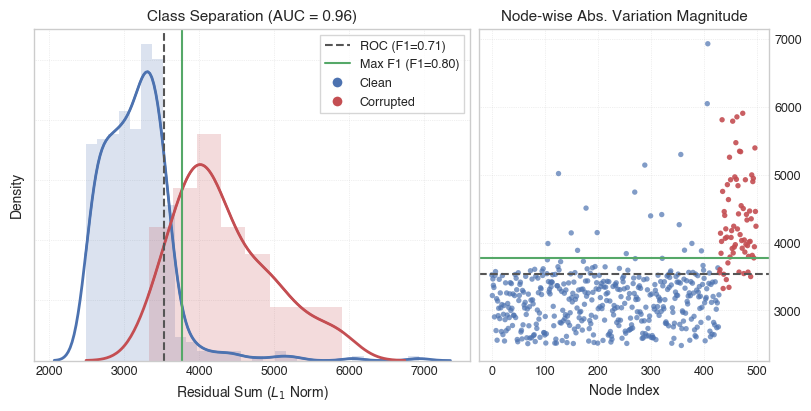

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve, f1_score
from matplotlib.lines import Line2D

# --- 1. ICML Style Configuration (Boxed Edition) ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica', 'Arial', 'DejaVu Sans'],
    'pdf.fonttype': 42,
    'ps.fonttype': 42,

    'font.size': 10,
    'axes.labelsize': 10,
    'axes.titlesize': 11,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 12,

    # --- BOXED STYLE SETTINGS ---
    'axes.linewidth': 1.0,       
    'grid.linewidth': 0.5,
    'lines.linewidth': 1.5,
    
    # 1. Point ticks inward
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    
    # 2. Enable ticks on Top and Right (Mirroring)
    'xtick.top': True,
    'ytick.right': True,
    
    # 3. Force all Spines (Borders) to be visible
    'axes.spines.top': True,
    'axes.spines.right': True,
    'axes.spines.left': True,
    'axes.spines.bottom': True,

    'axes.prop_cycle': plt.cycler('color', sns.color_palette("deep")) 
})

# --- 2. Data Logic (Your original logic) ---
all_scores_ordered = np.concatenate([group_clean, group_corrupted])
true_labels = np.concatenate([np.zeros(len(group_clean)), np.ones(len(group_corrupted))])

# --- 3. Calculate Stats ---
fpr, tpr, roc_thresholds = roc_curve(true_labels, all_scores_ordered)
ix_roc = np.argmax(tpr - fpr)
best_thresh_roc = roc_thresholds[ix_roc]
roc_auc = auc(fpr, tpr)
f1_at_roc = f1_score(true_labels, (all_scores_ordered >= best_thresh_roc).astype(int))

precisions, recalls, pr_thresholds = precision_recall_curve(true_labels, all_scores_ordered)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-10)
ix_f1 = np.argmax(f1_scores)
best_thresh_f1 = pr_thresholds[ix_f1]
best_f1_val = f1_scores[ix_f1]

# --- 4. Plotting ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), constrained_layout=True, gridspec_kw={'width_ratios': [3, 2]})

c_clean = "#4C72B0"
c_corr = "#C44E52"
c_roc = "#555555"
c_f1 = "#55A868"

# === LEFT PANEL: Histograms ===
sns.histplot(group_clean, color=c_clean, label="Clean", kde=True, stat="density", 
             alpha=0.2, linewidth=0, ax=ax1)
sns.histplot(group_corrupted, color=c_corr, label="Corrupted", kde=True, stat="density", 
             alpha=0.2, linewidth=0, ax=ax1)

sns.kdeplot(group_clean, color=c_clean, ax=ax1, linewidth=2)
sns.kdeplot(group_corrupted, color=c_corr, ax=ax1, linewidth=2)

ax1.axvline(best_thresh_roc, color=c_roc, linestyle='--', label=f'ROC Opt')
ax1.axvline(best_thresh_f1, color=c_f1, linestyle='-', label=f'F1 Opt')

ax1.set_title(f"Class Separation (AUC = {roc_auc:.2f})")
ax1.set_xlabel('Residual Sum ($L_1$ Norm)')
ax1.set_ylabel('Density')
ax1.set_yticklabels([])

# Legend: Added specific formatting for a box around the legend too
#ax1.legend(frameon=True, fancybox=False, loc='upper right')
# Custom Legend with Box
legend_elements = [
    Line2D([0], [0], color=c_roc, linestyle='--', label=f'ROC (F1={f1_at_roc:.2f})'),
    Line2D([0], [0], color=c_f1, linestyle='-', label=f'Max F1 (F1={best_f1_val:.2f})'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=c_clean, label='Clean', markersize=8),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=c_corr, label='Corrupted', markersize=8)
]
ax1.legend(handles=legend_elements, frameon=True, fancybox=False, loc='upper right')
ax1.grid(True, linestyle=':', alpha=0.6)

# IMPORTANT: I removed `sns.despine(ax=ax1)` to keep the box intact.

# === RIGHT PANEL: Scatter ===
clean_indices = np.arange(len(group_clean))
corr_indices = np.arange(len(group_clean), len(all_scores_ordered))

ax2.scatter(clean_indices, group_clean, s=15, alpha=0.7, color=c_clean, label='Clean Nodes', edgecolors='none')
ax2.scatter(corr_indices, group_corrupted, s=15, alpha=0.9, color=c_corr, label='Corrupted Nodes', edgecolors='none')

ax2.axhline(best_thresh_roc, color=c_roc, linestyle='--', linewidth=1.5, label='ROC Thresh')
ax2.axhline(best_thresh_f1, color=c_f1, linestyle='-', linewidth=1.5, label='F1 Thresh')

ax2.set_xlabel('Node Index')
#ax2.set_ylabel('Residual Magnitude')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")

ax2.set_title('Node-wise Abs. Variation Magnitude')

ax2.grid(True, linestyle=':', alpha=0.6)

# IMPORTANT: I removed `sns.despine(ax=ax2)` here as well.
#plt.savefig("swiss_res.pdf", dpi=300, bbox_inches='tight')
plt.show()

**Relation to existing baselines for homophily**

In [ ]:
from framework.utils import compute_node_feature_assortativity

assortativity = np.array(list(compute_node_feature_assortativity(G, single_graph.x.numpy()).values()))

In [ ]:
def perfom_classification_benchmark_on_scalar(group_clean, group_corrupted):
    # We use equal_var=False to perform Welch's t-test, which does not assume 
    # equal population variance (often safer when comparing normal vs corrupted data).
    t_stat, p_val = stats.ttest_ind(group_clean, group_corrupted, equal_var=False)
    print(f"T-statistic: {t_stat}")
    print(f"P-value: {p_val}")
    d = cohens_d(group_clean, group_corrupted)
    print(f"Cohen's d: {d}")
    # --- 1. Data Prep (Assumes group_clean and group_corrupted exist) ---
    # Reconstruct the full array for the scatter plot
    all_scores_ordered = np.concatenate([group_clean, group_corrupted])
    true_labels = np.concatenate([np.zeros(len(group_clean)), np.ones(len(group_corrupted))])

    # --- 2. Calculate Thresholds & Metrics ---

    # ROC Curve & AUC
    fpr, tpr, roc_thresholds = roc_curve(true_labels, all_scores_ordered)
    ix_roc = np.argmax(tpr - fpr)
    best_thresh_roc = roc_thresholds[ix_roc]
    roc_auc = auc(fpr, tpr)
    f1_at_roc = f1_score(true_labels, (all_scores_ordered >= best_thresh_roc).astype(int))

    # Precision-Recall Curve & F1 Optimal Threshold
    precisions, recalls, pr_thresholds = precision_recall_curve(true_labels, all_scores_ordered)
    f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-10)
    ix_f1 = np.argmax(f1_scores)
    best_thresh_f1 = pr_thresholds[ix_f1]
    best_f1_val = f1_scores[ix_f1]

    # --- NEW: Calculate Full ICML Metrics Suite ---
    # We use the "F1 Optimal Threshold" to generate the binary predictions 
    # for the hard metrics (MCC, Acc, etc.) as this is the standard 'tuned' classifier.

    pred_labels_optimal = (all_scores_ordered >= best_thresh_f1).astype(int)

    # Continuous Metrics (do not depend on threshold)
    pr_auc = average_precision_score(true_labels, all_scores_ordered)

    # Discrete Metrics (depend on threshold)
    acc = accuracy_score(true_labels, pred_labels_optimal)
    mcc = matthews_corrcoef(true_labels, pred_labels_optimal)
    precision = precision_score(true_labels, pred_labels_optimal)
    recall = recall_score(true_labels, pred_labels_optimal)
    ari = adjusted_rand_score(true_labels, pred_labels_optimal)
    nmi = normalized_mutual_info_score(true_labels, pred_labels_optimal)
    cm = confusion_matrix(true_labels, pred_labels_optimal)

    print("\n=== ICML Standard Metrics Report ===")
    print(f"Selected Threshold     : {best_thresh_f1:.4f} (Maximizes F1)")
    print("------------------------------------")
    print(f"ROC AUC                : {roc_auc:.4f}")
    print(f"PR AUC (Avg Precision) : {pr_auc:.4f}")
    print(f"Matthews Corr. Coeff.  : {mcc:.4f}")
    print(f"Accuracy               : {acc:.4f}")
    print(f"F1 Score               : {best_f1_val:.4f}")
    print(f"Precision              : {precision:.4f}")
    print(f"Recall                 : {recall:.4f}")
    print(f"Adjusted Rand Index    : {ari:.4f}")
    print(f"Normalized Mutual Info : {nmi:.4f}")
    print("\nConfusion Matrix:")
    print(cm)
    print("====================================\n")
    

In [ ]:
group_clean_assortativity, group_corrupted_assortativity = assortativity[:-CORRUPTED_NODES], assortativity[-CORRUPTED_NODES:]
perfom_classification_benchmark_on_scalar(group_clean_assortativity, group_corrupted_assortativity)

T-statistic: -3.206743411251951
P-value: 0.0017980010565188285
Cohen's d: -0.3741198582058572

=== ICML Standard Metrics Report ===
Selected Threshold     : 0.5782 (Maximizes F1)
------------------------------------
ROC AUC                : 0.6429
PR AUC (Avg Precision) : 0.1814
Matthews Corr. Coeff.  : 0.2324
Accuracy               : 0.6120
F1 Score               : 0.3490
Precision              : 0.2281
Recall                 : 0.7429
Adjusted Rand Index    : 0.0454
Normalized Mutual Info : 0.0504

Confusion Matrix:
[[254 176]
 [ 18  52]]



In [ ]:
import numpy as np
import networkx as nx

def compute_node_dirichlet_energy(G, node_features):
    """
    Computes the local Dirichlet Energy for each node based on d-dimensional features.
    
    The local Dirichlet Energy is a measure of signal 'roughness' or 'tension' at a node.
    It is calculated as the sum of squared Euclidean distances between a node's features 
    and the features of its neighbors.

    Args:
        G (nx.Graph): The NetworkX graph.
        node_features (np.ndarray): A (N x D) array where N is the number of nodes
                                     and D is the dimensionality of features. 
                                     Assumes row i corresponds to node ID i.

    Returns:
        dict: A dictionary where keys are node IDs and values are their
              local Dirichlet energy scores.
              - Low Score: Node is in a homophilic neighborhood (smooth).
              - High Score: Node is a structural outlier or bridge (heterophilic).
    """
    num_nodes = G.number_of_nodes()
    if node_features.shape[0] != num_nodes:
        raise ValueError("Number of nodes in graph and feature matrix must match.")

    # 1. Assign features to nodes for easy access during neighbor iteration
    # We assume node labels are integers 0 to N-1 matching the feature matrix rows
    for i in range(num_nodes):
        if i in G:
            G.nodes[i]['features'] = node_features[i]
        else:
            # Fallback if nodes are not 0..N-1 integers (e.g. if using a subgraph)
            # This logic assumes the list of nodes is ordered same as features
            nodes_list = sorted(list(G.nodes()))
            node_id = nodes_list[i]
            G.nodes[node_id]['features'] = node_features[i]

    def squared_euclidean(vec1, vec2):
        """Computes squared L2 norm ||x - y||^2"""
        return np.sum((vec1 - vec2) ** 2)

    node_energies = {}

    for node_id in G.nodes():
        node_feat = G.nodes[node_id].get('features')
        
        # Safety check if features weren't assigned correctly
        if node_feat is None:
            continue
            
        neighbors = list(G.neighbors(node_id))

        if not neighbors:
            # Isolated nodes have 0 energy (no tension with neighbors)
            node_energies[node_id] = 0.0 
            continue

        energy_sum = 0.0
        for neighbor_id in neighbors:
            neighbor_feat = G.nodes[neighbor_id]['features']
            
            # Calculate distance squared
            dist_sq = squared_euclidean(node_feat, neighbor_feat)
            
            # If graph is weighted, scale by edge weight (standard Laplacian definition)
            # Default to 1.0 if unweighted
            weight = G[node_id][neighbor_id].get('weight', 1.0)
            
            energy_sum += weight * dist_sq

        # The local Dirichlet energy is the sum of weighted squared differences
        node_energies[node_id] = energy_sum

    return node_energies

In [ ]:
dirichlet_energy = np.array(list(compute_node_dirichlet_energy(G, single_graph.x.numpy()).values()))
group_clean_dirichlet, group_corrupted_dirichlet = dirichlet_energy[:-CORRUPTED_NODES], dirichlet_energy[-CORRUPTED_NODES:]
perfom_classification_benchmark_on_scalar(group_clean_dirichlet, group_corrupted_dirichlet)

T-statistic: -10.807469972882618
P-value: 1.6267137575282353e-16
Cohen's d: -3.3337983295115836

=== ICML Standard Metrics Report ===
Selected Threshold     : 77.8993 (Maximizes F1)
------------------------------------
ROC AUC                : 0.9954
PR AUC (Avg Precision) : 0.9784
Matthews Corr. Coeff.  : 0.9325
Accuracy               : 0.9840
F1 Score               : 0.9412
Precision              : 0.9697
Recall                 : 0.9143
Adjusted Rand Index    : 0.9124
Normalized Mutual Info : 0.8143

Confusion Matrix:
[[428   2]
 [  6  64]]



In [ ]:
sums2 = np.sum((adjacency_matrix * np.nan_to_num(res, 0.0))**2, axis=0)
group_clean2, group_corrupted2 = sums2[:-CORRUPTED_NODES], sums2[-CORRUPTED_NODES:]
perfom_classification_benchmark_on_scalar(group_clean2, group_corrupted2)

T-statistic: -10.935022677136422
P-value: 9.073430465195818e-17
Cohen's d: -3.2346354206241985

=== ICML Standard Metrics Report ===
Selected Threshold     : 113.8414 (Maximizes F1)
------------------------------------
ROC AUC                : 0.9917
PR AUC (Avg Precision) : 0.9563
Matthews Corr. Coeff.  : 0.8656
Accuracy               : 0.9680
F1 Score               : 0.8841
Precision              : 0.8971
Recall                 : 0.8714
Adjusted Rand Index    : 0.8291
Normalized Mutual Info : 0.6788

Confusion Matrix:
[[423   7]
 [  9  61]]



In [ ]:
res

array([[ 0.       , 10.080502 ,  7.5036726, ..., 13.872692 , 11.987787 ,
        11.115726 ],
       [10.080502 ,  0.       ,  6.349147 , ...,  7.689453 ,  4.9295235,
         5.2811317],
       [ 7.5036726,  6.349147 ,  0.       , ...,  6.395117 ,  5.2124844,
         3.977128 ],
       ...,
       [13.872692 ,  7.689453 ,  6.395117 , ...,  0.       ,  2.8907554,
         2.782372 ],
       [11.987787 ,  4.9295235,  5.2124844, ...,  2.8907554,  0.       ,
         1.3239089],
       [11.115726 ,  5.2811317,  3.977128 , ...,  2.782372 ,  1.3239089,
         0.       ]], dtype=float32)

In [ ]:
from scipy.stats import median_abs_deviation

res = (dists_phase2 - local_dists_phase1)**2
res_log = np.log(res + 1e-4)
activations = 0.6745 * (res_log - np.median(res_log)) / median_abs_deviation(res_log)
#activations = (res_log - np.mean(res_log)) / np.sqrt(np.var(res_log))

sums3 = np.sum(np.nan_to_num(activations, 0.0), axis=0)
group_clean3, group_corrupted3 = sums3[:-CORRUPTED_NODES], sums3[-CORRUPTED_NODES:]
perfom_classification_benchmark_on_scalar(group_clean3, group_corrupted3) 

T-statistic: -14.61563563683412
P-value: 5.927967417768738e-25
Cohen's d: -2.1451717041088605

=== ICML Standard Metrics Report ===
Selected Threshold     : -26.4394 (Maximizes F1)
------------------------------------
ROC AUC                : 0.9648
PR AUC (Avg Precision) : 0.6934
Matthews Corr. Coeff.  : 0.8012
Accuracy               : 0.9440
F1 Score               : 0.8250
Precision              : 0.7333
Recall                 : 0.9429
Adjusted Rand Index    : 0.7313
Normalized Mutual Info : 0.5833

Confusion Matrix:
[[406  24]
 [  4  66]]



The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


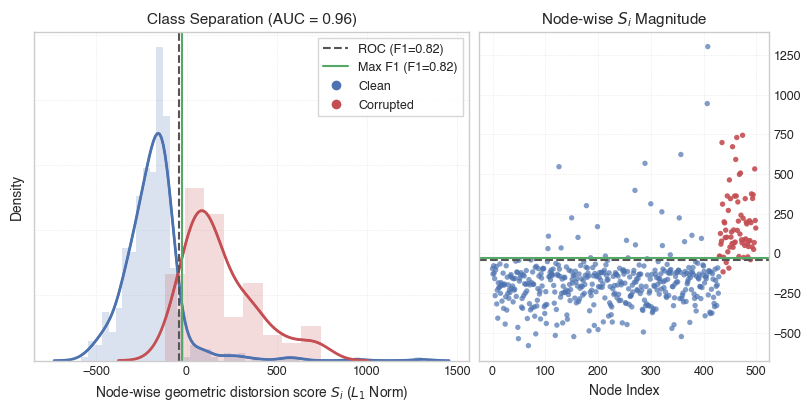

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc, precision_recall_curve, f1_score
from matplotlib.lines import Line2D

# --- 1. ICML Style Configuration (Boxed Edition) ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica', 'Arial', 'DejaVu Sans'],
    'pdf.fonttype': 42,
    'ps.fonttype': 42,

    'font.size': 10,
    'axes.labelsize': 10,
    'axes.titlesize': 11,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 12,

    # --- BOXED STYLE SETTINGS ---
    'axes.linewidth': 1.0,       
    'grid.linewidth': 0.5,
    'lines.linewidth': 1.5,
    
    # 1. Point ticks inward
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    
    # 2. Enable ticks on Top and Right (Mirroring)
    'xtick.top': True,
    'ytick.right': True,
    
    # 3. Force all Spines (Borders) to be visible
    'axes.spines.top': True,
    'axes.spines.right': True,
    'axes.spines.left': True,
    'axes.spines.bottom': True,

    'axes.prop_cycle': plt.cycler('color', sns.color_palette("deep")) 
})

# --- 2. Data Logic (Your original logic) ---
all_scores_ordered = np.concatenate([group_clean3, group_corrupted3])
true_labels = np.concatenate([np.zeros(len(group_clean3)), np.ones(len(group_corrupted3))])

# --- 3. Calculate Stats ---
fpr, tpr, roc_thresholds = roc_curve(true_labels, all_scores_ordered)
ix_roc = np.argmax(tpr - fpr)
best_thresh_roc = roc_thresholds[ix_roc]
roc_auc = auc(fpr, tpr)
f1_at_roc = f1_score(true_labels, (all_scores_ordered >= best_thresh_roc).astype(int))

precisions, recalls, pr_thresholds = precision_recall_curve(true_labels, all_scores_ordered)
f1_scores = 2 * (precisions * recalls) / (precisions + recalls + 1e-10)
ix_f1 = np.argmax(f1_scores)
best_thresh_f1 = pr_thresholds[ix_f1]
best_f1_val = f1_scores[ix_f1]

# --- 4. Plotting ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), constrained_layout=True, gridspec_kw={'width_ratios': [3, 2]})

c_clean = "#4C72B0"
c_corr = "#C44E52"
c_roc = "#555555"
c_f1 = "#55A868"

# === LEFT PANEL: Histograms ===
sns.histplot(group_clean3, color=c_clean, label="Clean", kde=True, stat="density", 
             alpha=0.2, linewidth=0, ax=ax1)
sns.histplot(group_corrupted3, color=c_corr, label="Corrupted", kde=True, stat="density", 
             alpha=0.2, linewidth=0, ax=ax1)

sns.kdeplot(group_clean3, color=c_clean, ax=ax1, linewidth=2)
sns.kdeplot(group_corrupted3, color=c_corr, ax=ax1, linewidth=2)

ax1.axvline(best_thresh_roc, color=c_roc, linestyle='--', label=f'ROC Opt')
ax1.axvline(best_thresh_f1, color=c_f1, linestyle='-', label=f'F1 Opt')

ax1.set_title(f"Class Separation (AUC = {roc_auc:.2f})")
ax1.set_xlabel('Node-wise geometric distorsion score $S_i$ ($L_1$ Norm)')
ax1.set_ylabel('Density')
ax1.set_yticklabels([])

# Legend: Added specific formatting for a box around the legend too
#ax1.legend(frameon=True, fancybox=False, loc='upper right')
# Custom Legend with Box
legend_elements = [
    Line2D([0], [0], color=c_roc, linestyle='--', label=f'ROC (F1={f1_at_roc:.2f})'),
    Line2D([0], [0], color=c_f1, linestyle='-', label=f'Max F1 (F1={best_f1_val:.2f})'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=c_clean, label='Clean', markersize=8),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=c_corr, label='Corrupted', markersize=8)
]
ax1.legend(handles=legend_elements, frameon=True, fancybox=False, loc='upper right')
ax1.grid(True, linestyle=':', alpha=0.6)

# IMPORTANT: I removed `sns.despine(ax=ax1)` to keep the box intact.

# === RIGHT PANEL: Scatter ===
clean_indices = np.arange(len(group_clean))
corr_indices = np.arange(len(group_clean), len(all_scores_ordered))

ax2.scatter(clean_indices, group_clean3, s=15, alpha=0.7, color=c_clean, label='Clean Nodes', edgecolors='none')
ax2.scatter(corr_indices, group_corrupted3, s=15, alpha=0.9, color=c_corr, label='Corrupted Nodes', edgecolors='none')

ax2.axhline(best_thresh_roc, color=c_roc, linestyle='--', linewidth=1.5, label='ROC Thresh')
ax2.axhline(best_thresh_f1, color=c_f1, linestyle='-', linewidth=1.5, label='F1 Thresh')

ax2.set_xlabel('Node Index')
#ax2.set_ylabel('Residual Magnitude')
ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")

ax2.set_title(r'Node-wise $S_i$ Magnitude')

ax2.grid(True, linestyle=':', alpha=0.6)

# IMPORTANT: I removed `sns.despine(ax=ax2)` here as well.
plt.savefig("swiss_res.eps", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import numpy as np
from scipy import stats
from sklearn.feature_selection import mutual_info_regression
pearson_corr, pearson_p = stats.pearsonr(assortativity, sums3)

# Spearman Correlation (measures monotonic relationship)
spearman_corr, spearman_p = stats.spearmanr(assortativity, sums3)

# Mutual Information (measures general dependency, including non-linear)
# Note: reshaped as a 2D array for the scikit-learn API
mi = mutual_info_regression(assortativity.reshape(-1, 1), sums3)[0]

print(f"Pearson: r = {pearson_corr:.4f}, p = {pearson_p:.4g}")
print(f"Spearman: rho = {spearman_corr:.4f}, p = {spearman_p:.4g}")
print(f"Mutual Information: {mi:.4f}")

Pearson: r = 0.3193, p = 2.575e-13
Spearman: rho = 0.3288, p = 4.548e-14
Mutual Information: 0.2725
